# Detecting Coconut Trees from the Air in the South Pacific (Tonga)

![tile05](tile05.jpg)

## Motivation & Sources

- https://werobotics.org/blog/2018/01/10/open-ai-challenge/
- https://docs.google.com/document/d/16kKik2clGutKejU8uqZevNY6JALf4aVk2ELxLeR-msQ/edit

> In collaboration with WeRobotics and OpenAerialMap, the World Bank’s UAVs for Disaster Resilience Program captured ~80km2 of high resolution (under 10 cm) aerial imagery in the Kingdom of Tonga in October 2017. The World Bank now seek qualified teams to develop machine learning classifiers to automate the analysis of this imagery. The classifiers will also be applied to new imagery to speed up baseline analysis and damage assessments in the future. 


> Being able to quantify the number of trees that serve as an important source of livelihood  for local communities is essential. These trees and their locations can then be compared before and after major disasters to better understand just how much local agriculture and hence food security has been affected. This can directly inform and accelerate subsequent relief efforts. The focus on roads is also meant to help identify the impact of natural disasters on local transportation infrastructure and to inform how best to distribute aid across affected areas.

- original GeoTIFF file: https://map.openaerialmap.org/#/-175.34310311079025,-21.097543257642922,18/square/20002233030/5a28640ebac48e5b1c58a81d?_k=a2zw5d
- original annotations file: https://drive.google.com/file/d/1rumWHzO3_CO40uXhaP69roUyfFzYCe20

> Note: The aerial imagery provided for this challenge is under a CC-BY creative commons license. The OSM training data (roads, building, trees, ets) is provided under the Open Data Commons Open Database License (ODbL).

## 4 tree types annotated as lon/lat point coordinates:
- coconut: Cocos nucifera **<-- In these notebooks, we are focused on detecting coconut trees only (single class)**
- mango: Mangifera indica
- banana: Musaceae, Musa
- papaya: Carica papaya
- other points annotated: population centers, power poles, manmand barriers and misc. fixtures

## Pre-processing overview:

![coconut-preprocessing-steps](Coconut-preprocessing-steps.jpg)

## Notebooks summary:
### 1. "coconuts-tilegen":
- Reproject original GeoTIFF to WGS 84 
- Create tiles and convert lat, lon to x,y display offset coordinates for all trees within each tile (15 tiles)


### 2. "coconuts-imagegen":
- Generate 224px x 224px patches for each tile.
- Convert x,y offsets for each tree point into square bbox coordinates (or rectangles at the borders)
- Filter out patches that do not contain any trees
- Save remaining patches as jpeg images with corresponding bbox and category labels (4062 jpg files)

### 3. "coconuts-model":
- Load jpegs and bbox/cat labels into model notebook and train away!

# Postprocessed Dataset Download

**Use this notebook with final postprocessed training files (after tilegen and imagegen) **

1. Download jpeg images and bbox/cat labels here (50MB): https://www.dropbox.com/s/g4isvnc577bg6ud/coconuts_0329_train.zip?dl=0

2. Unzip into your project data folder (i.e. 'data/tonga/')

3. Unzipped file structure should look like:
```
── train
       ├── jpegs
             ├── 4063 jpeg files
       ├── mbb_noempties.csv
       ├── mc_noempties.csv 
       ├── models
       ├── tmp
```

# Setup

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
from fastai.conv_learner import *
from fastai.dataset import *

from pathlib import Path
import json, pdb
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects

import pandas as pd

In [3]:
PATH = Path('data/tonga/train')
JPEGS = 'jpegs'
IMG_PATH = PATH/JPEGS
CSV_SUFFIX = 'noempties'

df = pd.read_csv(PATH/f'mc_{CSV_SUFFIX}.csv')
df2 = pd.read_csv(PATH/f'mbb_{CSV_SUFFIX}.csv')

In [4]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.set_xticks(np.linspace(0, 224, 8))
    ax.set_yticks(np.linspace(0, 224, 8))
    ax.grid()
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    return ax

def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)
    
def bb_hw(a): return np.array([a[1],a[0],a[3]-a[1],a[2]-a[0]])

def draw_im(im, ann):
    ax = show_img(im, figsize=(16,8))
    for b,c in ann:
        b = bb_hw(b)
        draw_rect(ax, b)
        draw_text(ax, b[:2], cats[c], sz=16)

def draw_idx(i):
    im_a = trn_anno[i]
    im = open_image(IMG_PATH/trn_fns[i])
    draw_im(im, im_a)

In [5]:
df.head()

,fn,clas
0,000000.jpg,coconut_tree coconut_tree
1,000001.jpg,coconut_tree
2,000002.jpg,coconut_tree coconut_tree
3,000003.jpg,coconut_tree coconut_tree
4,000004.jpg,coconut_tree coconut_tree coconut_tree


In [6]:
df2.head()

,fn,bbox
0,000000.jpg,0 97 53 187 168 0 224 72
1,000001.jpg,54 166 144 224
2,000002.jpg,156 141 224 224 15 168 105 224
3,000003.jpg,120 59 210 149 19 90 109 180
4,000004.jpg,81 121 171 211 165 67 224 157 7 0 97 77


In [7]:
df_all = pd.merge(df, df2, on='fn')
df_all.head()

,fn,clas,bbox
0,000000.jpg,coconut_tree coconut_tree,0 97 53 187 168 0 224 72
1,000001.jpg,coconut_tree,54 166 144 224
2,000002.jpg,coconut_tree coconut_tree,156 141 224 224 15 168 105 224
3,000003.jpg,coconut_tree coconut_tree,120 59 210 149 19 90 109 180
4,000004.jpg,coconut_tree coconut_tree coconut_tree,81 121 171 211 165 67 224 157 7 0 97 77


In [8]:
df_all.shape

(4063, 3)

# Process Label CSVs and Create Trn and Val sets

In [9]:
MBB_CSV = PATH/f'mbb_{CSV_SUFFIX}.csv'
CLAS_CSV = PATH/f'mc_{CSV_SUFFIX}.csv'

In [10]:
MBB_CSV, CLAS_CSV

(PosixPath('data/tonga/train/mbb_noempties.csv'),
 PosixPath('data/tonga/train/mc_noempties.csv'))

In [11]:
f_model = resnet34
sz = 224
bs = 64

In [12]:
# manually defining categories since there's only one (coconut_tree). 
# Using {1: 'banana_tree'} as a hack to help with debugging zeropadded cat labels later on. There are no actual banana_tree labels

cats = {
    1: 'banana_tree',
    2: 'coconut_tree'
}

In [ ]:
trn_ids = [int(str(o['fn']).split('.')[0]) for i, o in df_all.iterrows()]
trn_ids

In [ ]:
trn_fns = dict((trn_ids[i], df['fn'][i]) for i,o in df.iterrows())
trn_fns

In [15]:
def get_trn_anno():
    trn_anno = collections.defaultdict(lambda:[])
    for i,o in df_all.iterrows():
        #print(o)
        bb = o['bbox']
        bb = bb.split(' ')
        bb = np.asarray(bb).astype(int)
        #print(bb)
        num_bb = int(len(bb)/4)
        for j in range(num_bb):
            bb_4 = bb[j*4:j*4+4]
            each_bb = np.array([bb_4[0], bb_4[1], bb_4[2], bb_4[3]]) # bbox in y_min, x_min, y_max, x_max order
            #print(each_bb)
            trn_anno[trn_ids[i]].append((each_bb,2))
    return trn_anno

trn_anno = get_trn_anno()

In [20]:
trn_anno[0], trn_anno[1], trn_anno[2]

([(array([  0,  97,  53, 187]), 2), (array([168,   0, 224,  72]), 2)],
 [(array([ 54, 166, 144, 224]), 2)],
 [(array([156, 141, 224, 224]), 2), (array([ 15, 168, 105, 224]), 2)])

In [21]:
mc = [[cats[p[1]] for p in trn_anno[o]] for o in trn_ids]
mc[:3]

[['coconut_tree', 'coconut_tree'],
 ['coconut_tree'],
 ['coconut_tree', 'coconut_tree']]

In [22]:
id2cat = list(cats.values())
cat2id = {v:k for k,v in enumerate(id2cat)}
mcs = np.array([np.array([cat2id[p] for p in o]) for o in mc])
mcs[:3]

array([array([1, 1]), array([1]), array([1, 1])], dtype=object)

In [23]:
len(mcs)

4063

In [24]:
val_idxs = get_cv_idxs(len(trn_fns))
((val_mcs,trn_mcs),) = split_by_idx(val_idxs, mcs)
len(val_mcs), len(trn_mcs)

(812, 3251)

# Model creation

In [25]:
# maybe try random zoom and rotate later. Just doing rotations and mirrors for now
aug_tfms = [RandomDihedral(tfm_y=TfmType.COORD),
           ]

In [26]:
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, aug_tfms=aug_tfms, tfm_y=TfmType.COORD)
md = ImageClassifierData.from_csv(PATH, JPEGS, MBB_CSV, tfms=tfms, continuous=True)

In [27]:
md.val_ds.fnames[:5]

array(['jpegs/000006.jpg', 'jpegs/000008.jpg', 'jpegs/000012.jpg', 'jpegs/000014.jpg', 'jpegs/000017.jpg'],
      dtype='<U16')

In [28]:
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

def get_cmap(N):
    color_norm  = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_colr = 12
cmap = get_cmap(num_colr)
colr_list = [cmap(float(x)) for x in range(num_colr)]

In [29]:
def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [bb_hw(o) for o in bbox.reshape(-1,4)]
    if prs is None:  prs  = [None]*len(bb)
    if clas is None: clas = [None]*len(bb)
    ax = show_img(im, ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb, clas, prs)):
        if((b[2]>0) and (pr is None or pr > thresh)):
            draw_rect(ax, b, color=colr_list[i%num_colr])
            txt = f'{i}: '
            if c is not None: txt += ('bg' if c==len(id2cat) else id2cat[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=colr_list[i%num_colr])

In [30]:
class ConcatLblDataset(Dataset):
    def __init__(self, ds, y2):
        self.ds,self.y2 = ds,y2
        self.sz = ds.sz
    def __len__(self): return len(self.ds)
    
    def __getitem__(self, i):
        x,y = self.ds[i]
        return (x, (y,self.y2[i]))

In [31]:
trn_ds2 = ConcatLblDataset(md.trn_ds, trn_mcs)
val_ds2 = ConcatLblDataset(md.val_ds, val_mcs)
md.trn_dl.dataset = trn_ds2
md.val_dl.dataset = val_ds2

In [32]:
md.trn_ds[0]

(array([[[-0.97055, -0.95342, -1.00479, ...,  0.89605,  0.43368, -0.18281],
         [-1.10754, -1.09042, -1.12467, ...,  0.29669, -0.06293, -0.3883 ],
         [-1.22742, -1.21029, -1.24454, ...,  0.03981, -0.28556, -0.47393],
         ...,
         [-0.16568,  0.15969,  0.27956, ...,  1.46117,  1.11867,  1.2728 ],
         [ 0.10831,  0.21106,  0.24531, ...,  1.54679,  1.25567,  1.3413 ],
         [ 0.19394,  0.10831,  0.05694, ...,  1.52967,  1.37555,  1.4098 ]],
 
        [[-0.60014, -0.58263, -0.63515, ...,  1.13305,  0.60784, -0.02241],
         [-0.7402 , -0.72269, -0.7577 , ...,  0.52031,  0.10014, -0.23249],
         [-0.88025, -0.86274, -0.88025, ...,  0.27521, -0.10994, -0.30252],
         ...,
         [-0.0049 ,  0.32773,  0.45028, ...,  1.79832,  1.44818,  1.60574],
         [ 0.27521,  0.38025,  0.41527, ...,  1.88585,  1.62325,  1.71078],
         [ 0.36275,  0.27521,  0.22269, ...,  1.86835,  1.7458 ,  1.78081]],
 
        [[-0.77612, -0.72383, -0.77612, ...,  0.63564,

In [38]:
x,y=to_np(next(iter(md.trn_dl)))
x=md.trn_ds.ds.denorm(x)

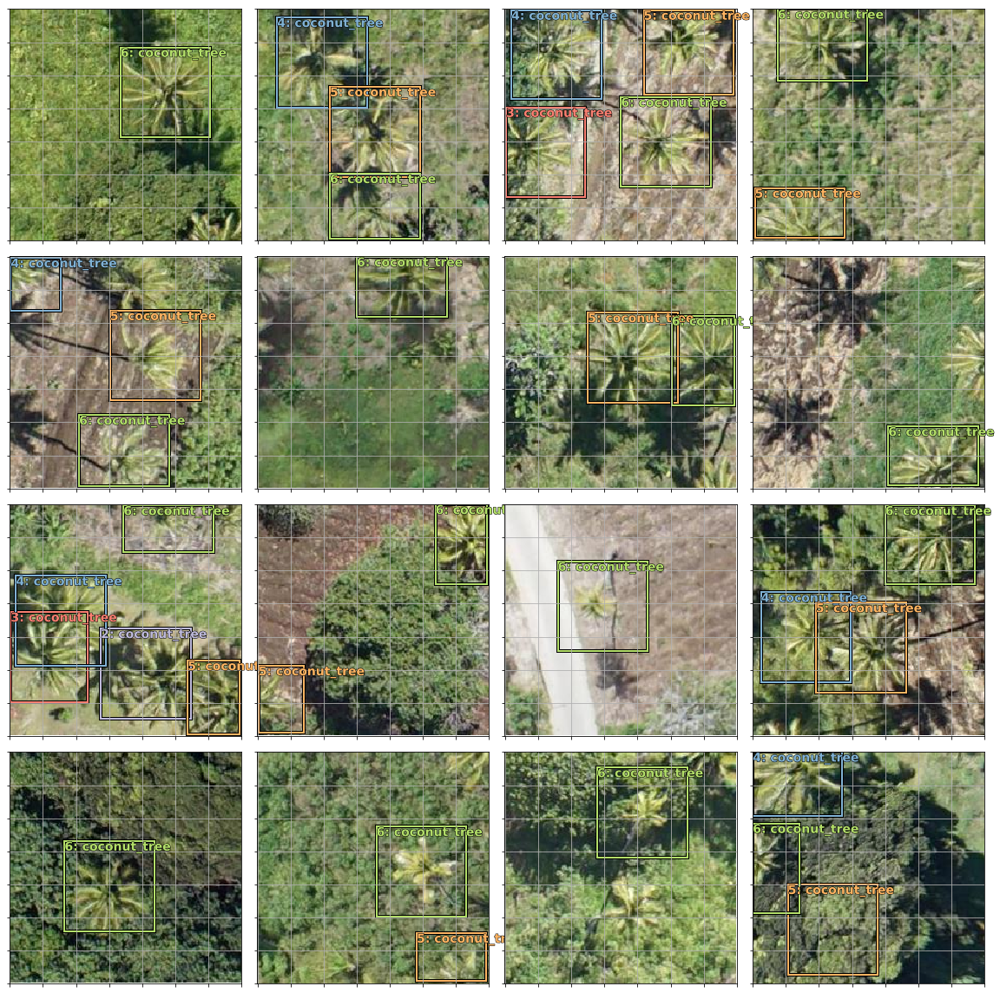

In [39]:
# sanity check augmentations and correctly transformed bounding boxes in trn_ds
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
for i,ax in enumerate(axes.flat):
    show_ground_truth(ax, x[i], y[0][i], y[1][i], prs=None, thresh=0.)
    #draw_text(ax, (0,0), )
plt.tight_layout()

In [40]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

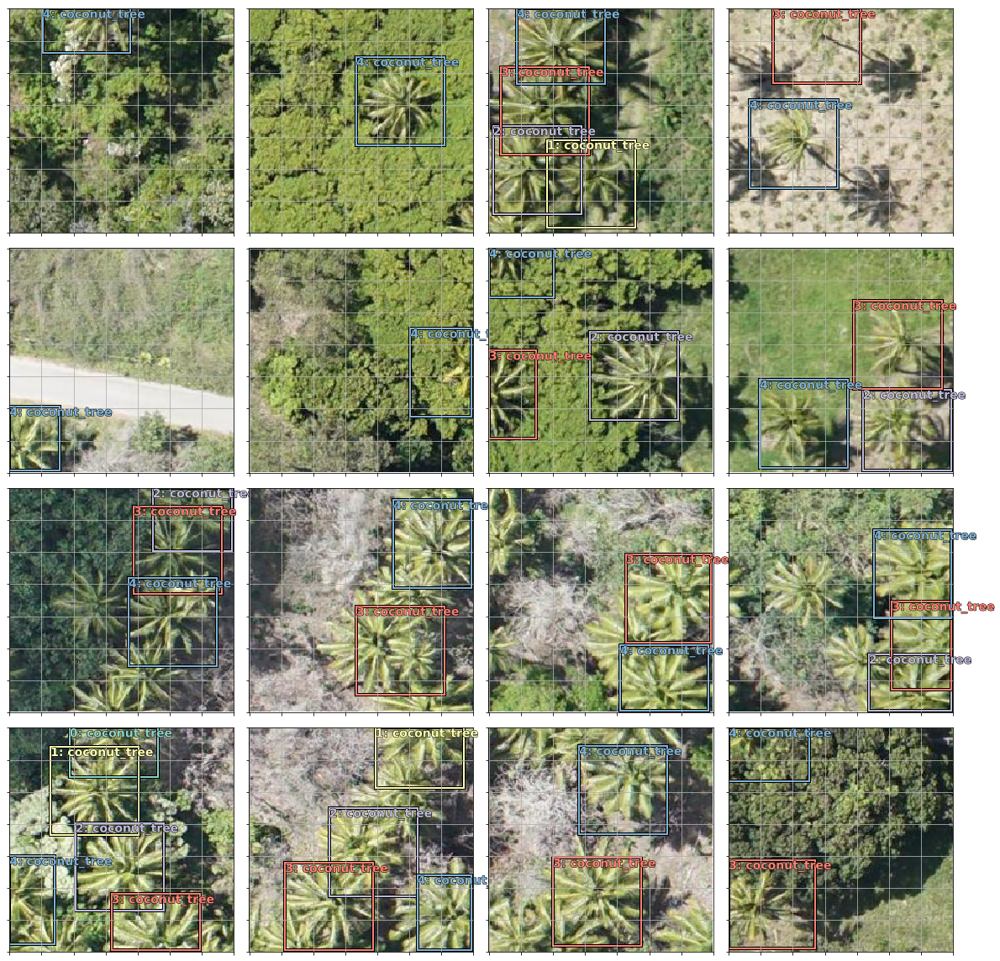

In [42]:
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
for i,ax in enumerate(axes.flat):
    #i = i+20
    show_ground_truth(ax, x[i], y[0][i], y[1][i], prs=None, thresh=0.)
plt.tight_layout()

# Model-related base functions all in one place

In [43]:
def hw2corners(ctr, hw): return torch.cat([ctr-hw/2, ctr+hw/2], dim=1)

In [44]:
class StdConv(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x): return self.drop(self.bn(F.relu(self.conv(x))))
        
def flatten_conv(x,k):
    bs,nf,gx,gy = x.size()
    x = x.permute(0,2,3,1).contiguous()
    return x.view(bs,-1,nf//k)

In [45]:
class OutConv(nn.Module):
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (len(id2cat)+1)*k, 3, padding=1)
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]

In [46]:
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None

loss_f = BCE_Loss(len(id2cat))

In [47]:
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

def jaccard(box_a, box_b):
    inter = intersect(box_a, box_b)
    union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
    return inter / union

In [48]:
def get_y(bbox,clas):
    #pdb.set_trace()
    bbox = bbox.view(-1,4)/sz
    bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]
    return bbox[bb_keep],clas[bb_keep]

def actn_to_bb(actn, anchors):
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:]
    return hw2corners(actn_centers, actn_hw)

def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)
    if print_it: print(prior_overlap)
#     pdb.set_trace()
    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): gt_idx[o] = i
    return gt_overlap,gt_idx

def ssd_1_loss(b_c,b_bb,bbox,clas,print_it=False):
    #pdb.set_trace()
    bbox,clas = get_y(bbox,clas)
    a_ic = actn_to_bb(b_bb, anchors)
    overlaps = jaccard(bbox.data, anchor_cnr.data)
    gt_overlap,gt_idx = map_to_ground_truth(overlaps,print_it)
    gt_clas = clas[gt_idx]
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    gt_clas[1-pos] = len(id2cat)
    gt_bbox = bbox[gt_idx]
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    clas_loss  = loss_f(b_c, gt_clas)
    return loc_loss, clas_loss

def ssd_loss(pred,targ,print_it=False):
    lcs,lls = 0.,0.
    for b_c,b_bb,bbox,clas in zip(*pred,*targ):
        loc_loss,clas_loss = ssd_1_loss(b_c,b_bb,bbox,clas,print_it)
        lls += loc_loss
        lcs += clas_loss
    if print_it: print(lls,lcs)
    return lls+lcs

In [49]:
def torch_gt(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return show_ground_truth(ax, ima, to_np((bbox*224).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)

In [50]:
def plot_results(starting_idx, thresh):
    x,y = next(iter(md.val_dl))
    y = V(y)
    batch = learn.model(V(x))
    b_clas,b_bb = batch

    x = to_np(x)
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    for idx,ax in enumerate(axes.flat):
        idx = idx+starting_idx
        ima=md.val_ds.ds.denorm(x)[idx]
        bbox,clas = get_y(y[0][idx], y[1][idx])
        a_ic = actn_to_bb(b_bb[idx], anchors)
        clas_pr, clas_ids = b_clas[idx].max(1)
        clas_pr = clas_pr.sigmoid()
        torch_gt(ax, ima, a_ic, clas_ids, clas_pr, clas_pr.max().data[0]*thresh)
    plt.tight_layout()

# 189 Anchors

In [51]:
anc_grids = [4,2,1]
#anc_grids = [4]
anc_zooms = [0.9, 1., 1.1]
# anc_zooms = [1.]
anc_ratios = [(1.,1.), (1.,0.9), (0.9,1.)]
#anc_ratios = [(1.,1.)]
anchor_scales = [(anz*i,anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
k = len(anchor_scales)
anc_offsets = [1/(o*2) for o in anc_grids]

In [52]:
anc_x = np.concatenate([np.tile(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_y = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), k, axis=0)

In [53]:
anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids])
grid_sizes = V(np.concatenate([np.array([ 1/ag       for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids]), requires_grad=False).unsqueeze(1)
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [54]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

In [55]:
a=np.reshape((to_np(anchor_cnr) + to_np(torch.randn(*anchor_cnr.size()))*0.01)*224, -1)

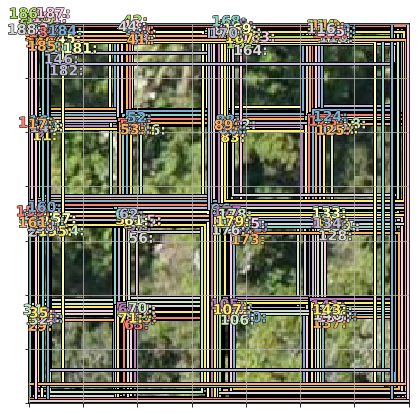

In [56]:
fig, ax = plt.subplots(figsize=(7,7))
show_ground_truth(ax, x[0], a)

In [57]:
drop=0.4

class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(drop)
        self.sconv1 = StdConv(512,256, drop=drop)
        self.sconv2 = StdConv(256,256, drop=drop)
        self.sconv3 = StdConv(256,256, drop=drop)
        self.out0 = OutConv(k, 256, bias)
        self.out1 = OutConv(k, 256, bias)
        self.out2 = OutConv(k, 256, bias)
        self.out3 = OutConv(k, 256, bias)

    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv1(x)
        o1c,o1l = self.out1(x)
        x = self.sconv2(x)
        o2c,o2l = self.out2(x) 
        x = self.sconv3(x)
        o3c,o3l = self.out3(x)
        return [torch.cat([o1c,o2c,o3c], dim=1),
                torch.cat([o1l,o2l,o3l], dim=1)]

head_reg4 = SSD_MultiHead(k, -4.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam

learn.crit = ssd_loss
lr = 1e-2
lrs = np.array([lr/100,lr/10,lr])

In [58]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(x)

In [59]:
batch[0].size(),batch[1].size()

(torch.Size([64, 189, 3]), torch.Size([64, 189, 4]))

In [ ]:
ssd_loss(batch, y, True)

In [61]:
learn.lr_find(lrs/100,10)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 75%|███████▍  | 38/51 [00:17<00:05,  2.17it/s, loss=2e+04]   

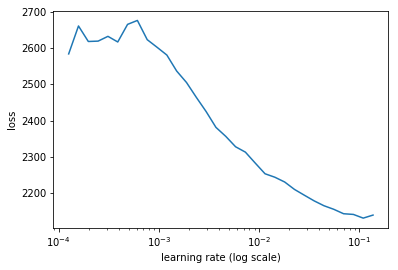

In [62]:
learn.sched.plot(1)

In [63]:
lr = 1e-2
lrs = np.array([lr/100,lr/10,lr])

In [64]:
learn.fit(lrs, 1, cycle_len=1, use_clr=(10,2))

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 12%|█▏        | 6/51 [00:08<01:02,  1.38s/it, loss=2.38e+03]


Exception in thread Thread-5:
Traceback (most recent call last):
  File "/home/paperspace/anaconda3/envs/fastai/lib/python3.6/threading.py", line 916, in _bootstrap_inner
    self.run()
  File "/home/paperspace/anaconda3/envs/fastai/lib/python3.6/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/home/paperspace/anaconda3/envs/fastai/lib/python3.6/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



epoch      trn_loss   val_loss                                
    0      1736.939184 1497.755371



[1497.7554]

In [65]:
learn.fit(lrs, 1, cycle_len=8, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=8), HTML(value='')))

epoch      trn_loss   val_loss                                
    0      1591.013716 1520.415771
    1      1558.947728 1423.216309                            
    2      1515.003273 1431.918213                            
    3      1463.730816 1354.383667                            
    4      1448.89607 1332.206177                             
    5      1415.294345 1317.046875                            
    6      1394.214783 1294.701782                            
    7      1378.719362 1288.069458                            



[1288.0695]

In [66]:
learn.freeze_to(-2)
learn.fit(lr, 1, cycle_len=10, use_clr=(10,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

epoch      trn_loss   val_loss                                
    0      1151.060135 1529.785156
    1      1038.139857 966.15564                              
    2      957.994156 849.761719                              
    3      907.828352 843.256775                         
    4      867.673019 814.276794                         
    5      845.990862 798.59137                          
    6      821.162575 797.978149                         
    7      799.218208 775.089966                         
    8      770.479291 766.069397                         
    9      744.75947  770.948486                         



[770.9485]

In [67]:
learn.save('defaulthead_nofocalloss_0329_1')

In [80]:
learn.load('defaulthead_nofocalloss_0329_1')

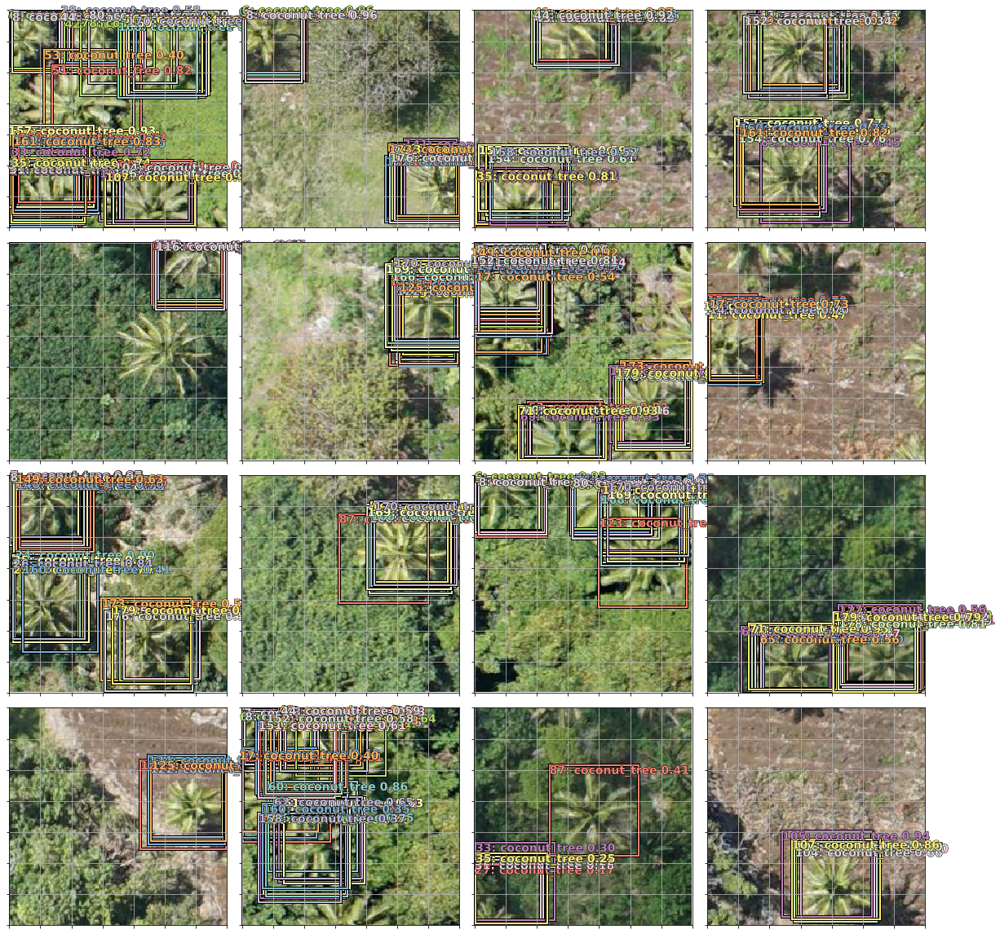

In [81]:
plot_results(20, 0.4)

# With Focal Loss

In [69]:
class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,2.
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

loss_f = FocalLoss(len(id2cat))

In [ ]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(x)
ssd_loss(batch, y, True)

In [71]:
lrs

array([0.0001, 0.001 , 0.01  ])

In [72]:
learn.lr_find(lrs/10000,10)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 78%|███████▊  | 40/51 [00:23<00:06,  1.72it/s, loss=1.7e+03]

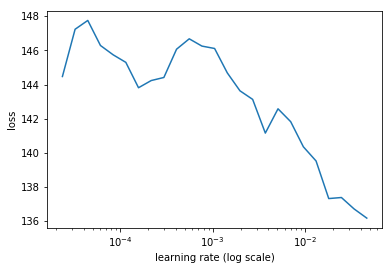

In [73]:
learn.sched.plot(10)

In [74]:
lr = 3e-3
lrs = np.array([lr/100,lr/10,lr])

In [75]:
learn.fit(lrs, 1, cycle_len=1, use_clr=(20,3))

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

  4%|▍         | 2/51 [00:04<01:40,  2.05s/it, loss=127]     


Exception in thread Thread-27:
Traceback (most recent call last):
  File "/home/paperspace/anaconda3/envs/fastai/lib/python3.6/threading.py", line 916, in _bootstrap_inner
    self.run()
  File "/home/paperspace/anaconda3/envs/fastai/lib/python3.6/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/home/paperspace/anaconda3/envs/fastai/lib/python3.6/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



epoch      trn_loss   val_loss                           
    0      103.200706 90.654121 



[90.65412]

In [76]:
learn.fit(lrs, 1, cycle_len=8, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=8), HTML(value='')))

epoch      trn_loss   val_loss                            
    0      87.095619  87.821724 
    1      85.743773  82.982178                           
    2      82.267139  84.599594                           
    3      80.962974  82.360893                           
    4      79.660758  81.203056                           
    5      79.084925  81.193321                           
    6      77.575181  81.437851                           
    7      76.431895  81.342377                           



[81.34238]

In [77]:
learn.save('defaulthead_focalloss_0329_1')

In [82]:
learn.load('defaulthead_focalloss_0329_1')

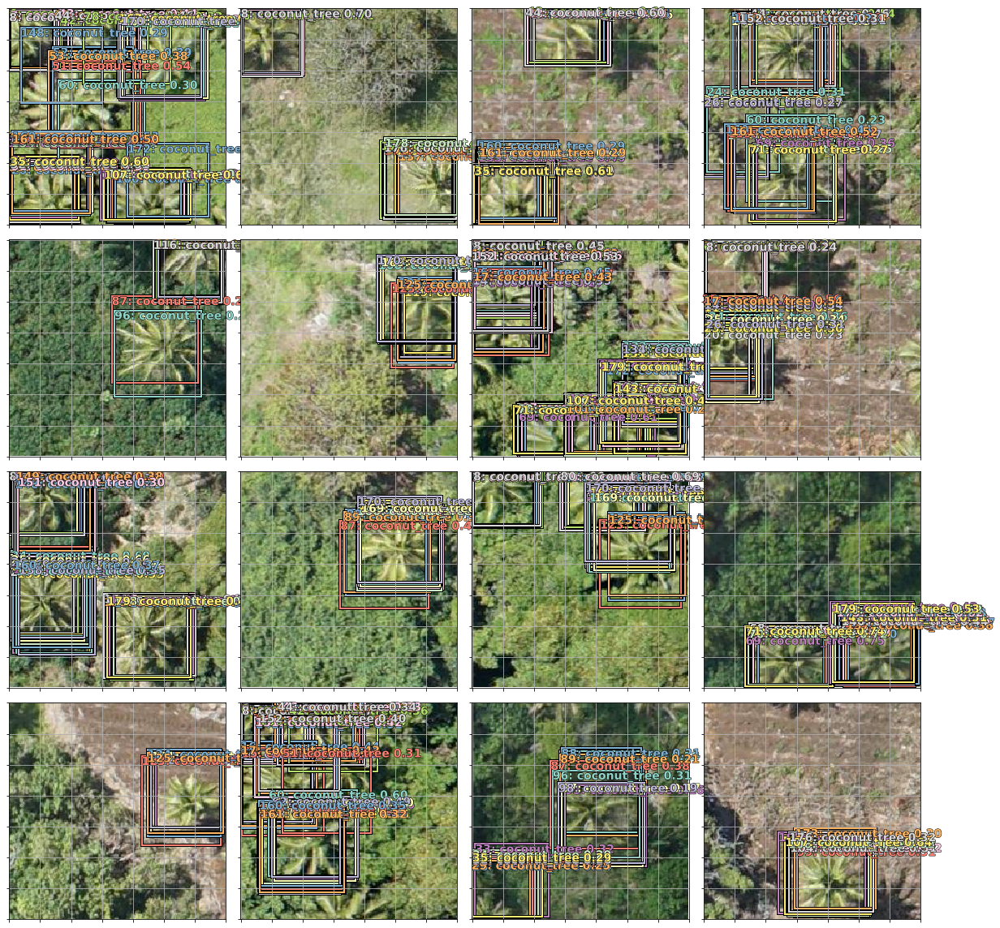

In [83]:
plot_results(20, .4)

# NMS

In [84]:
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

In [85]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

In [97]:
# adapted show_nmf() to display:
# column 1: predicted bboxes w/ len(predicted objects) on top
# column 2: the ground truth bboxes with len(gt objects) on top
# column 3: training image only, no grid  

def show_nmf_gt(idx):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    clas_pr, clas_ids = b_clas[idx].max(1)
    clas_pr = clas_pr.sigmoid()

    conf_scores = b_clas[idx].sigmoid().t().data

    out1,out2,cc = [],[],[]
    for cl in range(0, len(conf_scores)-1):
        c_mask = conf_scores[cl] > 0.25
        if c_mask.sum() == 0: continue
        scores = conf_scores[cl][c_mask]
        l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
        boxes = a_ic[l_mask].view(-1, 4)
        ids, count = nms(boxes.data, scores, 0.4, 50)
        ids = ids[:count]
        out1.append(scores[ids])
        out2.append(boxes.data[ids])
        cc.append([cl]*count)
        
    if not cc: cc = [[0]]
    cc = T(np.concatenate(cc))
    
    if not out1: out1 = T([0.]) 
    else: out1 = torch.cat(out1)
    if not out2: out2 = T([0., 0., 0., 0.]) 
    else: out2 = torch.cat(out2)
        
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 45))
    torch_gt(ax1, ima, out2, cc, out1, 0.)
    title1_str = 'idx '+str(idx)+', # of predicted objects: '+ str(len([x for x in out1 if x > 0]))
    ax1.text(0,-10,title1_str)
    
    torch_gt(ax2, ima, bbox, clas, None, 0.)
    title2_str = 'idx '+str(idx)+', # of ground truth objects: '+ str(len(clas))
    ax2.text(0,-10,title2_str)
    
    show_img(ima, ax=ax3)
    ax3.grid(False)

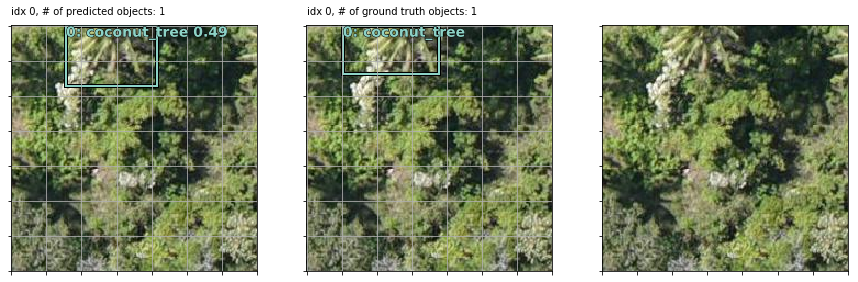

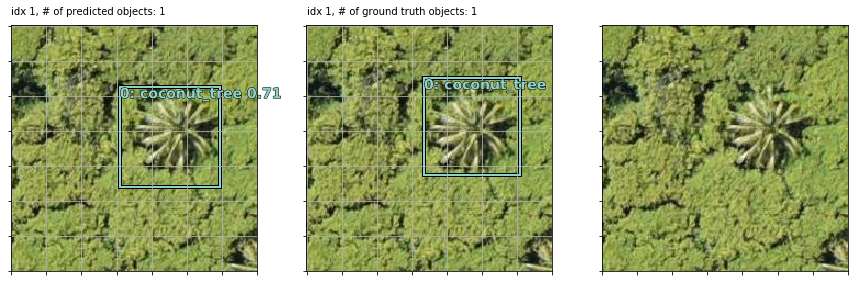

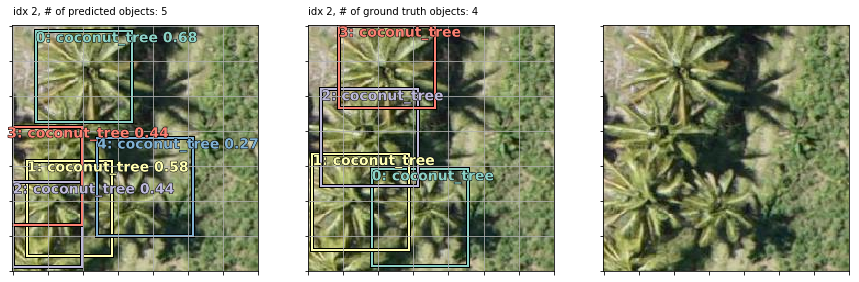

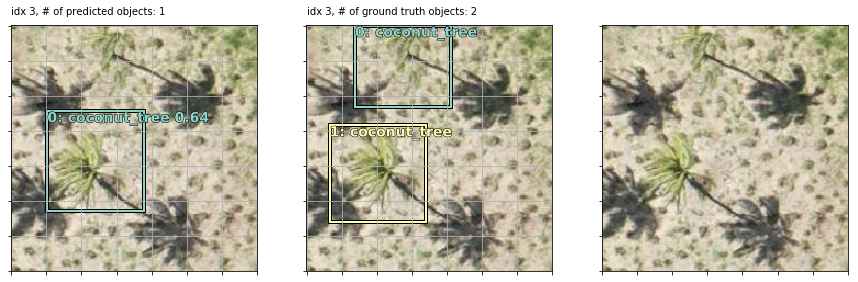

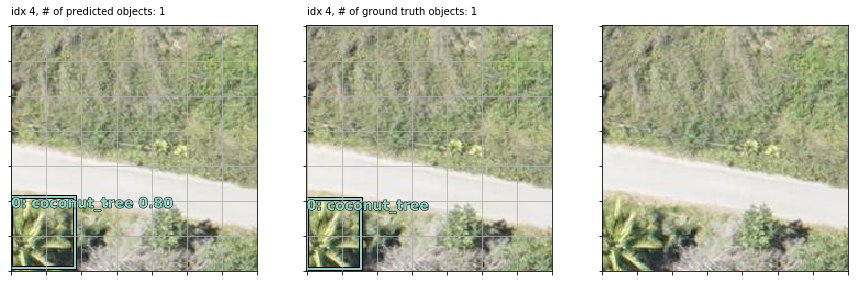

...

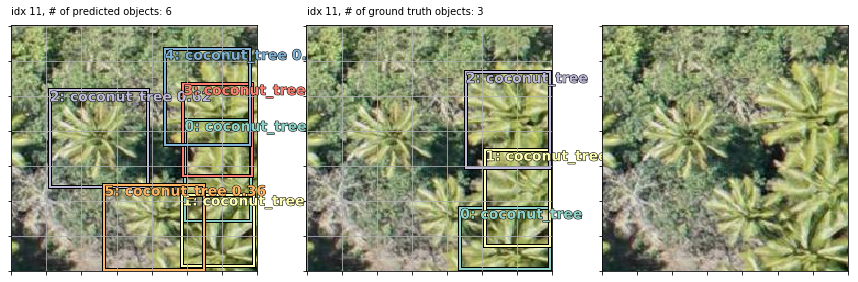

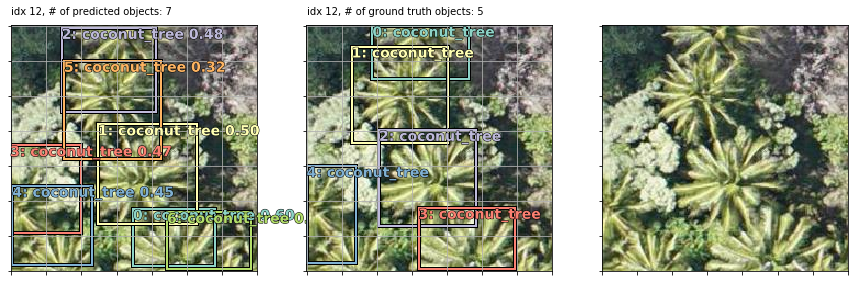

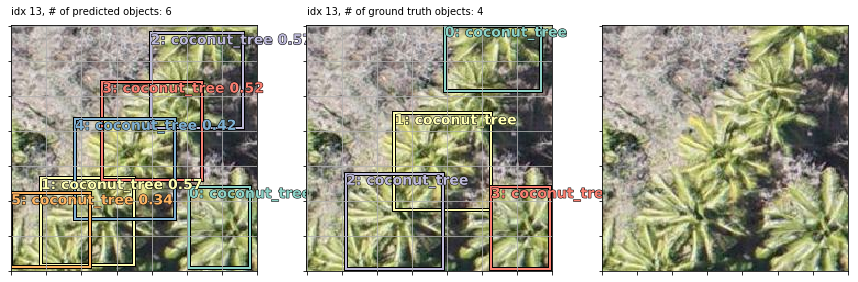

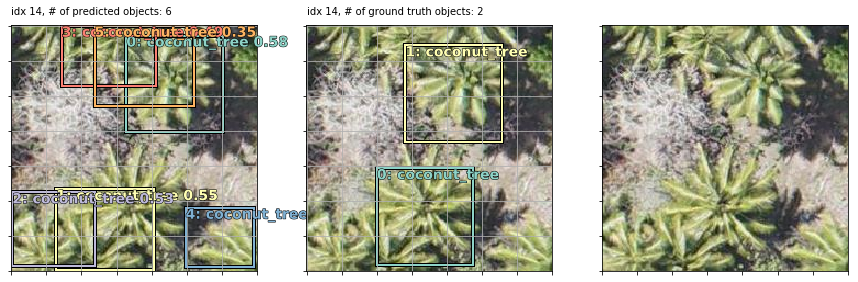

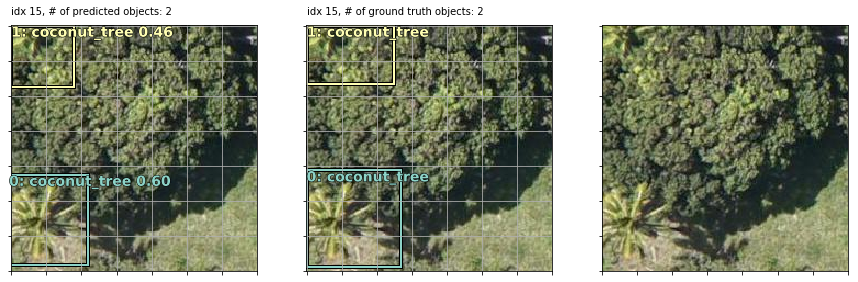

In [98]:
for i in range(0,16): show_nmf_gt(i)

# To Do (as of Mar 29)
1. Performance test anchor bugfix/hack (adding adaptive_max_pool to SSD_MultiHead) vs creating new custom head w/o pooling layer
2. Try different anchor num/size/shape
3. Try different augmentations
4. Try different thresholds for IoU, NMS
3. Implement mAP (mean average precision) metric: http://tarangshah.com/blog/2018-01-27/what-is-map-understanding-the-statistic-of-choice-for-comparing-object-detection-models/
4. Add new classes (+ banana, mango, papaya trees) to turn task into multi-class multi-label object detection